In [1]:
import numpy as np
import pandas as pd
import segyio
import os
import csv
import multiprocessing
from multiprocessing.pool import ThreadPool
from multiprocessing import Pool
import time 

from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.signal import fftconvolve
from scipy.signal import gaussian
from scipy.signal import hilbert
from scipy.ndimage import rotate
from scipy.ndimage.filters import convolve1d
from scipy.ndimage import median_filter
from scipy.ndimage import generic_filter1d
from scipy.signal import butter
from scipy.signal import filtfilt




import matplotlib.pyplot as plt

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

pd.set_option('display.max_rows', 200)

In [65]:
# update working directory and file names below

infile = '2D-line.sgy'
velfile = '2D-line-velocity.txt'
#compfile = 'parex-line10-stk_final.sgy'
#outfile = 'parex-line10-stk-pyfinal.sgy'
#testfile = 'test_output.sgy'


# Step 1 of workflow

In [66]:
# read in gathers using sequential programing
start=time.time()
with segyio.open(infile, ignore_geometry=True) as src:
    n_traces = src.tracecount
    sample_rate = segyio.tools.dt(src) / 1000
    n_samples = src.samples.size
    twt = src.samples
    cdp = np.asarray([int(src.header[i][21]) for i in range(src.tracecount)])
    offset = np.asarray([src.header[i][37] for i in range(src.tracecount)])
    fnl_stat = np.asarray([src.header[i][237] for i in range(src.tracecount)])
    intpdist = np.asarray([src.header[i][233] for i in range(src.tracecount)])
    datagath = src.trace.raw[:]
end=time.time()
time_sequen_gath=round(end-start,2)
time_sequen_gath

52.87

### Used processing pools 

In [67]:
%%file func_segopen.py
def read_traces(infile):
    import segyio
    import numpy as np
    with segyio.open(infile, ignore_geometry=True) as src:
        n_traces = src.tracecount
        sample_rate = segyio.tools.dt(src) / 1000
        n_samples = src.samples.size
        twt = src.samples
        cdp = np.asarray([int(src.header[i][21]) for i in range(src.tracecount)])
        offset = np.asarray([src.header[i][37] for i in range(src.tracecount)])
        fnl_stat = np.asarray([src.header[i][237] for i in range(src.tracecount)])
        intpdist = np.asarray([src.header[i][233] for i in range(src.tracecount)])
        return src.trace.raw[:]


Overwriting func_segopen.py


In [68]:
from func_segopen import read_traces
# read in gathers in parallel using processes
#the path has to be a python list in the map function, not sure why 
infile = ['2D-line.sgy']
start=time.time()
P_pool =Pool(processes=multiprocessing.cpu_count())
datagath_Pool = P_pool.map(read_traces,infile)

end=time.time()
time_parallelproce_gath=round(end-start,2)
time_parallelproce_gath

79.04

### Used Threading pools 

In [69]:
from func_segopen import read_traces
# read in gathers in parallel using processes
#the path has to be a python list in the map function, not sure why 
infile = ['2D-line.sgy']
def read_traces(infile):
    import segyio
    import numpy as np
    with segyio.open(infile, ignore_geometry=True) as src:
        n_traces = src.tracecount
        sample_rate = segyio.tools.dt(src) / 1000
        n_samples = src.samples.size
        twt = src.samples
        cdp = np.asarray([int(src.header[i][21]) for i in range(src.tracecount)])
        offset = np.asarray([src.header[i][37] for i in range(src.tracecount)])
        fnl_stat = np.asarray([src.header[i][237] for i in range(src.tracecount)])
        intpdist = np.asarray([src.header[i][233] for i in range(src.tracecount)])
        return src.trace.raw[:]
#start time here
start=time.time()
T_pool = ThreadPool(processes=multiprocessing.cpu_count())
datagath_Thr = T_pool.map(read_traces,infile)

end=time.time()
time_parallelthread_gath=round(end-start,2)
time_parallelthread_gath

51.8

### Comparing times 

In [74]:
#putting them in an array
t_read_traces=np.asarray([time_sequen_gath, time_parallelproce_gath, time_parallelthread_gath])
#obtaining the minimum of the array, which will return the optimized time using different programing methods. Position 1 is always pool of processes, and position 2 is always a pool of threads.
if np.argmin(t_read_traces)==1:
    print('The optimized time is obtained by using a pool Processes')
else:
    print('The optimized time is obtained by using a pool of Threads')

The optimized time is obtained by using a pool of Threads


### A pool of Threads seem to perform better in this stage of the workflow. This makes sense, as most steps in this workflow are I/O bound; the only CPU bound (computation) here is the sample rate line.

### When using the map function from the multiprocess library, the datagather matrix is returned as a list(datagath_Pool or datagath_Thr). Therefore, applying moveout underneath does not work, and so it must be transformed into a matrix of the same size of datagath.This is observed below:

In [75]:
datagath.shape

(195702, 1801)

In [76]:
datagath

array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [-3.7064237e-06,  5.6121396e-05,  2.6172446e-04, ...,
        -6.9353223e-02, -1.2837570e-02,  3.9791539e-03],
       [ 8.2383980e-05, -2.8243102e-04, -6.4762961e-04, ...,
         1.7763164e-02, -4.9648285e-03,  1.8545021e-03],
       [-2.1526388e-04, -6.9073844e-04, -1.9048191e-04, ...,
        -3.7303045e-03,  1.2152600e-03, -2.8005568e-04]], dtype=float32)

In [77]:
datagath_Pool

[array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [-3.7064237e-06,  5.6121396e-05,  2.6172446e-04, ...,
         -6.9353223e-02, -1.2837570e-02,  3.9791539e-03],
        [ 8.2383980e-05, -2.8243102e-04, -6.4762961e-04, ...,
          1.7763164e-02, -4.9648285e-03,  1.8545021e-03],
        [-2.1526388e-04, -6.9073844e-04, -1.9048191e-04, ...,
         -3.7303045e-03,  1.2152600e-03, -2.8005568e-04]], dtype=float32)]

In [78]:
datagath_Thr

[array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [-3.7064237e-06,  5.6121396e-05,  2.6172446e-04, ...,
         -6.9353223e-02, -1.2837570e-02,  3.9791539e-03],
        [ 8.2383980e-05, -2.8243102e-04, -6.4762961e-04, ...,
          1.7763164e-02, -4.9648285e-03,  1.8545021e-03],
        [-2.1526388e-04, -6.9073844e-04, -1.9048191e-04, ...,
         -3.7303045e-03,  1.2152600e-03, -2.8005568e-04]], dtype=float32)]

### Transforming the list of a matrix into just a matrix:

In [79]:
datagath_Pool=np.ravel(datagath_Pool)
datagath_Pool= datagath_Pool.reshape(datagath.shape[0],datagath.shape[1])
datagath_Pool.shape, datagath.shape

((195702, 1801), (195702, 1801))

In [80]:
datagath_Thr=np.ravel(datagath_Thr)
datagath_Thr= datagath_Thr.reshape(datagath.shape[0],datagath.shape[1])
datagath_Thr.shape, datagath.shape

((195702, 1801), (195702, 1801))

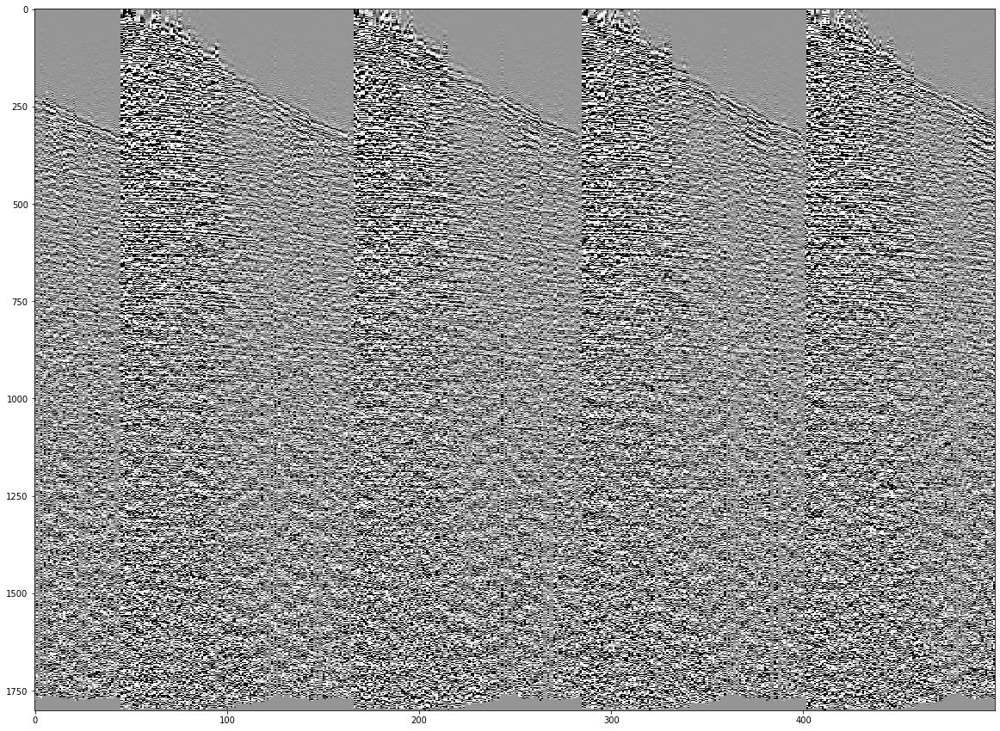

In [81]:
# qc input

plt.figure(figsize=(20,15))
plt.imshow(datagath[100000:100500].T,cmap='Greys', vmin=-0.1, vmax=0.1, aspect='auto',)

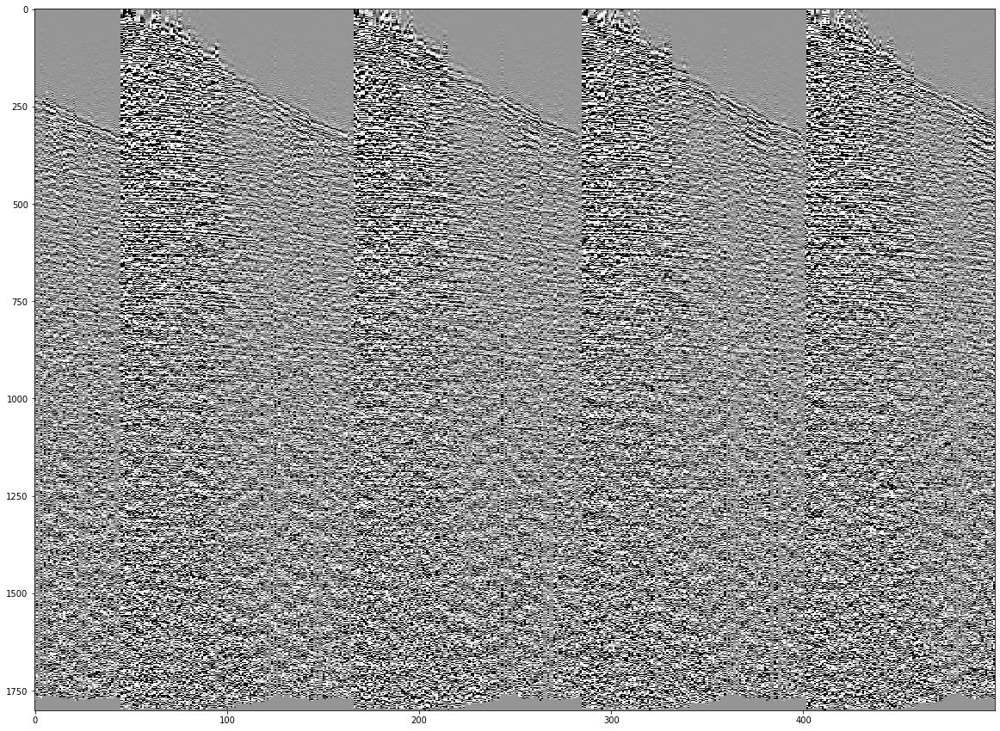

In [82]:
# qc input

plt.figure(figsize=(20,15))
plt.imshow(datagath_Pool[100000:100500].T,cmap='Greys', vmin=-0.1, vmax=0.1, aspect='auto',)

## Therefore, this works.

# Step 2 , only at the moveout cell

In [87]:
# import velocity for stretch mute

with open(velfile, newline='') as vel:
    velocity = csv.reader(vel, delimiter=' ', skipinitialspace=True)
    for i in range(4):
        next(velocity)
    row_count = sum(1 for row in velocity)
    
velcdp = np.zeros(shape=row_count)
veltime = np.zeros(shape=row_count)
velrms = np.zeros(shape=row_count)

with open(velfile, newline='') as vel:
    velocity = csv.reader(vel, delimiter=' ', skipinitialspace=True)
    for i in range(4):
        next(velocity)    
    for i, row in enumerate(velocity):
        velcdp[i] = row[0]
        veltime[i] = row[1]
        velrms[i] = row[2]
    

In [88]:
# interpolate velocity

velcdps = np.asarray(sorted(set(velcdp)))
cdps = np.asarray(sorted(set(cdp)))

velrms2 = np.zeros(shape=(len(velcdps), len(twt)))
velrms3 = np.zeros(shape=(len(cdps), len(twt)))
display(velrms2.shape, velrms3.shape)

for j, i in enumerate(velcdps):
    ind = np.where(velcdp==i)[0]
    velrms2[j] = interp1d(veltime[ind], velrms[ind], fill_value=(0,0), bounds_error=False)(twt)
    temp = np.min(np.nonzero(velrms2[j]))
    velrms2[j,:temp] = velrms2[j,temp]
    temp = np.max(np.nonzero(velrms2[j]))
    velrms2[j,temp:] = velrms2[j,temp]
    
for i in range(len(twt)):
    velrms3[:,i] = interp1d(velcdps, velrms2[:,i], fill_value=(0,0), bounds_error=False)(cdps)
    temp = np.min(np.nonzero(velrms3[:,i]))
    velrms3[:temp,i] = velrms3[temp,i]
    temp = np.max(np.nonzero(velrms3[:,i]))
    velrms3[temp:,i] = velrms3[temp,i]    



(44, 1801)

(2239, 1801)

In [89]:
# apply moveout
start=time.time()
display(datagath.shape)
datanmo = np.zeros(datagath.shape)
for x in range(n_traces):
    velloc = np.argwhere(cdps==cdp[x]).item()
    nmo = np.sqrt(twt**2 + (offset[x]**2/velrms3[velloc]**2)*1000000)
    datanmo[x] = CubicSpline(twt, datagath[x])(nmo)
end=time.time()
moveout_sequ_time=round(end-start,2)

(195702, 1801)

MemoryError: Unable to allocate 2.63 GiB for an array with shape (195702, 1801) and data type float64

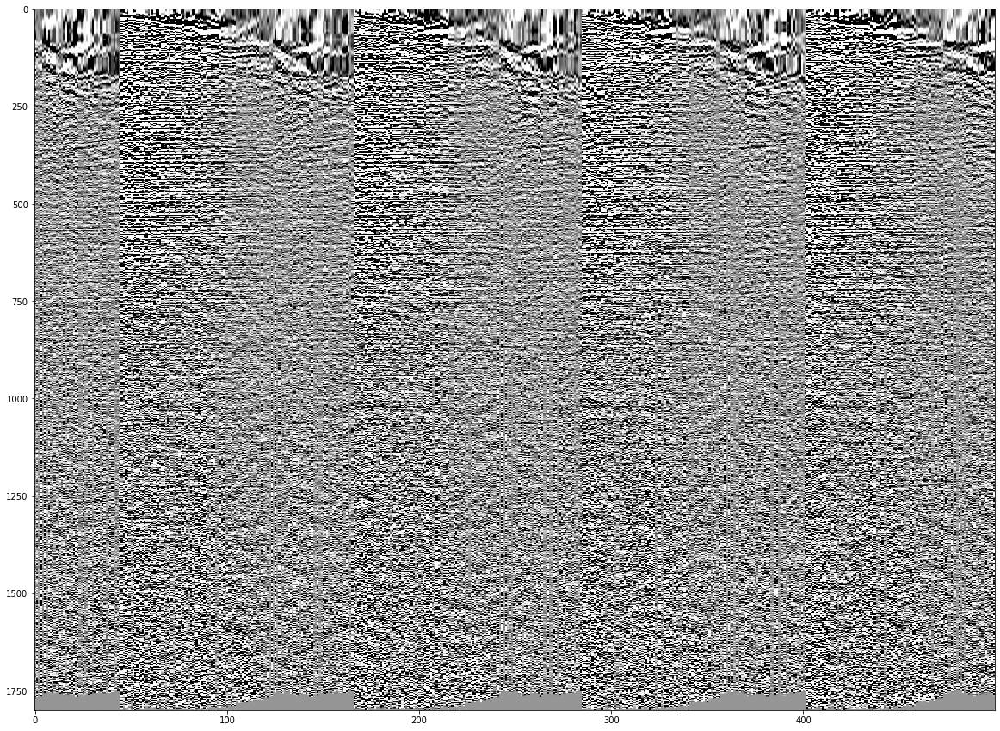

In [16]:
# qc gather

plt.figure(figsize=(20,15))
plt.imshow(datanmo[100000:100500].T,cmap='Greys', vmin=-0.1, vmax=0.1, aspect='auto',)

In [17]:
# stack

data = np.zeros((len(set(cdp)), datanmo.shape[1]))
j = 0
for i in (set(cdp)):
    gather = datanmo[np.where(cdp==i)[0],:]
    data[j] = gather.sum(axis=0)/((np.count_nonzero(gather, axis=0)**0.5+0.00001))
    j = j + 1


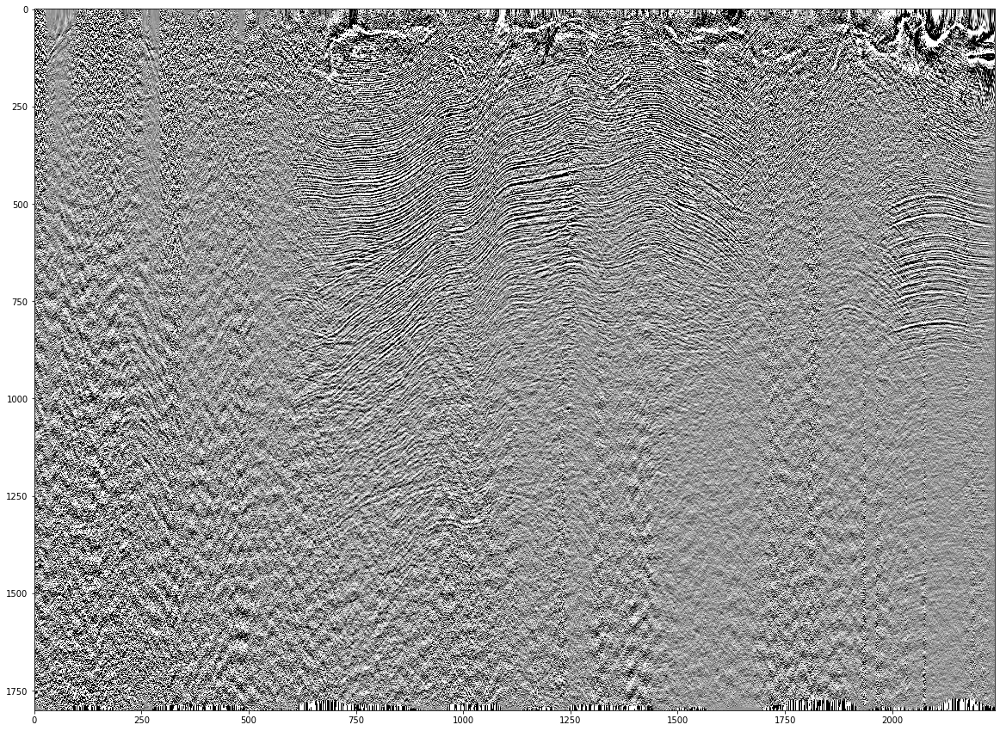

In [96]:
# qc stk

plt.figure(figsize=(20,15))
plt.imshow(data.T,cmap='Greys', vmin=-0.4, vmax=0.4, aspect='auto',)

In [18]:
# apply bandpass filter

b, a = butter(4, (8, 50), btype='bandpass', output='ba', fs=500)
datafilt = np.where(data == 0, 0, filtfilt(b,a, data))


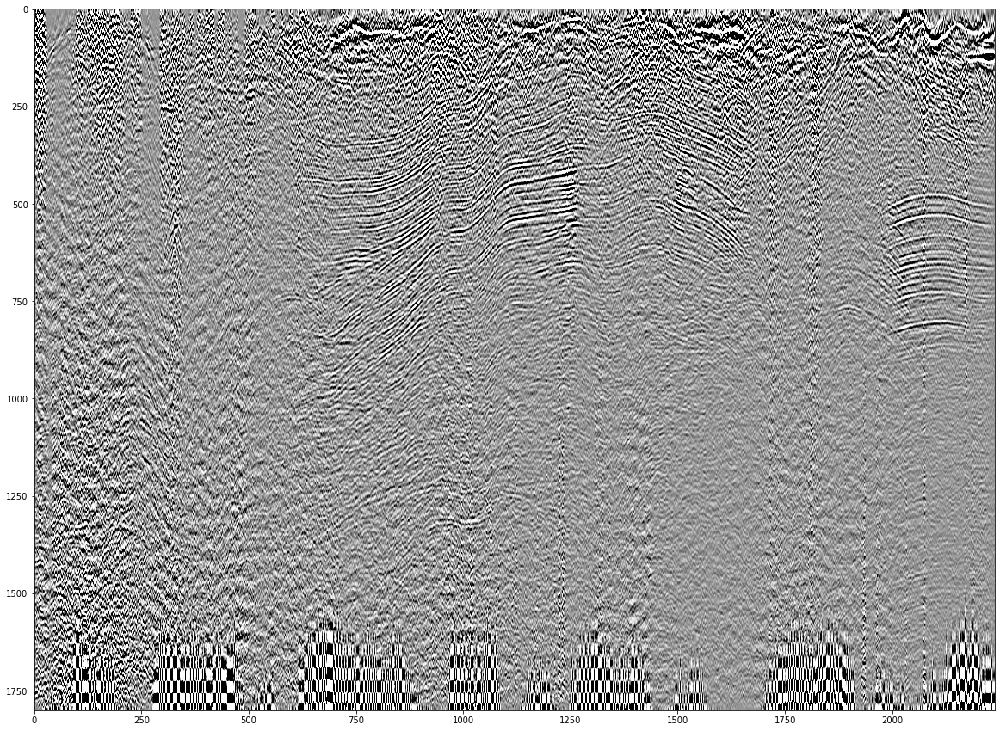

In [19]:
# qc stk

plt.figure(figsize=(20,15))
plt.imshow(datafilt.T,cmap='Greys', vmin=-0.4, vmax=0.4, aspect='auto',)

In [20]:
# apply median agc

datamagc = np.where(datafilt == 0, np.median(np.abs(datafilt)), datafilt)

meadagc = median_filter(np.abs(datamagc[:,::1]), size=(1,500))

datamagc = datamagc/meadagc
    
datamagc = np.where(data == 0, 0, datamagc)


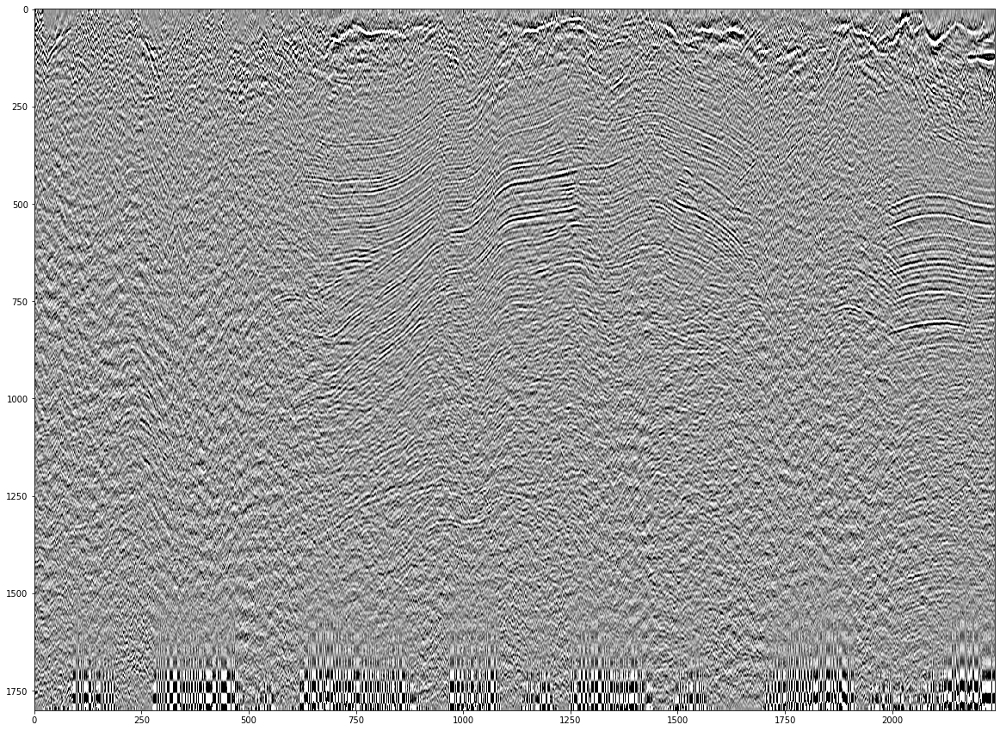

In [21]:
# qc stk

plt.figure(figsize=(20,15))
plt.imshow(datamagc.T,cmap='Greys', vmin=-4, vmax=4, aspect='auto',)